In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import plotly.express as px
import plotly.graph_objects as go
import plotly

import string
import datetime
from tqdm.auto import tqdm

from sklearn.preprocessing import LabelEncoder

sns.set(style='darkgrid', font_scale=1.3, palette='Set2')
plotly.offline.init_notebook_mode()

In [2]:
FEE = 0.001

NEWS_DIR = 'data_crypto/'
PRICES_DIR = 'data_crypto_prices/'
MODELS_DIR = 'best_models/'
PLOTS_DIR = 'plots/'
MAIN_DIR = './'

In [3]:
from google.colab import drive
drive.mount('/content/drive')

NEWS_DIR = '/content/drive/MyDrive/Investing/Colab/data_crypto/'
PRICES_DIR = '/content/drive/MyDrive/Investing/Colab/data_crypto_prices/'
MODELS_DIR = '/content/drive/MyDrive/Investing/Colab/best_models/'
PLOTS_DIR = '/content/drive/MyDrive/Investing/Colab/plots/'
MAIN_DIR = '/content/drive/MyDrive/Investing/Colab/'

Mounted at /content/drive


In [4]:
tickers = ['BTC']  # , 'ETH', 'LTC', 'XRP']

news = {
    ticker: pd.read_csv(NEWS_DIR + ticker + '.csv', 
                        parse_dates=['date'], 
                        index_col='date')
    for ticker in tickers
}
prices = {
    ticker: pd.read_csv(PRICES_DIR + ticker + '.csv', 
                        parse_dates=['date'], 
                        index_col='date') 
    for ticker in tickers
}

In [5]:
prices['BTC']

,unix,symbol,open,high,low,close,Volume BTC,Volume USD
date,,,,,,,,
2015-01-01 00:01:00+00:00,1420070460,BTC/USD,321.00,321.00,321.00,321.00,0.000000,0.000000
2015-01-01 00:02:00+00:00,1420070520,BTC/USD,321.00,321.00,321.00,321.00,1.413333,453.679999
2015-01-01 00:03:00+00:00,1420070580,BTC/USD,321.00,321.00,321.00,321.00,2.000000,642.000000
2015-01-01 00:04:00+00:00,1420070640,BTC/USD,320.98,320.98,320.43,320.43,2.843880,911.264468
2015-01-01 00:05:00+00:00,1420070700,BTC/USD,320.50,320.51,320.49,320.50,8.255000,2645.727500
...,...,...,...,...,...,...,...,...
2022-03-22 03:23:00+00:00,1647919380,BTC/USD,42313.73,42359.62,42300.00,42352.89,1.220523,51692.695844
2022-03-22 03:24:00+00:00,1647919440,BTC/USD,42320.51,42320.51,42276.17,42316.05,0.611748,25886.739490
2022-03-22 03:25:00+00:00,1647919500,BTC/USD,42305.08,42309.82,42294.32,42294.32,0.141064,5966.219491


In [6]:
def rename(name):
    is_other = all(c in string.hexdigits for c in name)
    if is_other:
        return 'Other'
    return name


for news_fd in news.values():
    news_fd['source'] = news_fd['source'].apply(rename)

news['BTC']

,ticker,source,title,body,link
date,,,,,
2017-06-12 12:03:00+00:00,bitcoin,investing-new,Top 5 things to watch today,\nInvesting.com - Wall Street tech giants set ...,https://www.investing.com/news/economy-news/to...
2017-06-13 15:06:00+00:00,bitcoin,investing-new,"Bitcoin pushes higher, Ethereum lower","\n\n\n© Reuters. Bitcoin pushes higher, Ethere...",https://www.investing.com/news/forex-news/bitc...
2017-06-13 19:29:00+00:00,bitcoin,investing-new,'Cryptomania' resumes as Bitcoin regains momentum,"\n\n\nBitcoin resumed its march back to $3,000...",https://www.investing.com/news/forex-news/-39;...
2017-06-14 18:51:00+00:00,bitcoin,investing-new,Bitcoin dips after hitting technical resistance,\n\n\n© Reuters. \n\n\nInvesting.com - Bitcoin...,https://www.investing.com/news/forex-news/bitc...
2017-06-15 12:33:00+00:00,bitcoin,investing-new,"Bitcoin, Ethereum plunge as much as 25% as bul...","\n\n\n© Reuters. Bitcoin, Ethereum plunge by a...",https://www.investing.com/news/forex-news/bitc...
...,...,...,...,...,...
2022-03-18 17:40:00+00:00,bitcoin,Other,Stranded no more? Bitcoin miners could help so...,\n\n\n© Reuters. \n\n\nThe energy usage and en...,https://www.investing.com/news/cryptocurrency-...
2022-03-18 18:20:00+00:00,bitcoin,Other,"Price analysis 3/18: BTC, ETH, BNB, XRP, LUNA,...",\n\n\n\n\n\nBitcoin (BTC) is facing a challeng...,https://www.investing.com/news/cryptocurrency-...
2022-03-18 19:20:00+00:00,bitcoin,Other,Paxful partners with Miami mayor to give away ...,\n\n\n© Reuters \n\n\nDigital payment platform...,https://www.investing.com/news/cryptocurrency-...


In [7]:
def show_prices():
    fig = go.Figure()

    for ticker in tickers:
        subdata = prices[ticker].resample('1h')['open'].last().dropna()

        fig.add_trace(
            go.Scattergl(
                x=subdata.index, 
                y=subdata,
                mode='lines',
                name=ticker,
            )
        )

    fig.show(renderer="colab")
    
show_prices()

In [42]:
news_btc = news['BTC'].drop_duplicates()
prices_btc = prices['BTC']

In [43]:
news_btc

,ticker,source,title,body,link
date,,,,,
2017-06-12 12:03:00+00:00,bitcoin,investing-new,Top 5 things to watch today,\nInvesting.com - Wall Street tech giants set ...,https://www.investing.com/news/economy-news/to...
2017-06-13 15:06:00+00:00,bitcoin,investing-new,"Bitcoin pushes higher, Ethereum lower","\n\n\n© Reuters. Bitcoin pushes higher, Ethere...",https://www.investing.com/news/forex-news/bitc...
2017-06-13 19:29:00+00:00,bitcoin,investing-new,'Cryptomania' resumes as Bitcoin regains momentum,"\n\n\nBitcoin resumed its march back to $3,000...",https://www.investing.com/news/forex-news/-39;...
2017-06-14 18:51:00+00:00,bitcoin,investing-new,Bitcoin dips after hitting technical resistance,\n\n\n© Reuters. \n\n\nInvesting.com - Bitcoin...,https://www.investing.com/news/forex-news/bitc...
2017-06-15 12:33:00+00:00,bitcoin,investing-new,"Bitcoin, Ethereum plunge as much as 25% as bul...","\n\n\n© Reuters. Bitcoin, Ethereum plunge by a...",https://www.investing.com/news/forex-news/bitc...
...,...,...,...,...,...
2022-03-18 17:40:00+00:00,bitcoin,Other,Stranded no more? Bitcoin miners could help so...,\n\n\n© Reuters. \n\n\nThe energy usage and en...,https://www.investing.com/news/cryptocurrency-...
2022-03-18 18:20:00+00:00,bitcoin,Other,"Price analysis 3/18: BTC, ETH, BNB, XRP, LUNA,...",\n\n\n\n\n\nBitcoin (BTC) is facing a challeng...,https://www.investing.com/news/cryptocurrency-...
2022-03-18 19:20:00+00:00,bitcoin,Other,Paxful partners with Miami mayor to give away ...,\n\n\n© Reuters \n\n\nDigital payment platform...,https://www.investing.com/news/cryptocurrency-...


In [44]:
minute = pd.Timedelta('1min')
day = pd.Timedelta('1day')
date_news = news_btc.index
date_news = date_news[date_news.isin(prices_btc.index)]

# min_left_shifts = [-600, -240, -120, -60, -30, -20, -10, -5, -3, -2, -1]
min_right_shifts = [1, 2, 5, 10, 20, 30, 60, 120, 240, 6*60, 12*60, 24*60]
# day_shifts = [-28, -14, -7, -2, -1]
    
# for day_shift in day_shifts + [0]:
#     for min_shift in min_left_shifts + [0] + min_right_shifts:
#         date_news = date_news[(date_news + day_shift * day + min_shift * minute).isin(prices_btc.index)]

for min_shift in min_right_shifts:
    date_news = date_news[(date_news + min_shift * minute).isin(prices_btc.index)]
    
date_news

DatetimeIndex(['2017-06-12 12:03:00+00:00', '2017-06-13 15:06:00+00:00',
               '2017-06-13 19:29:00+00:00', '2017-06-14 18:51:00+00:00',
               '2017-06-15 12:33:00+00:00', '2017-06-15 19:01:00+00:00',
               '2017-06-16 18:08:00+00:00', '2017-06-16 18:40:00+00:00',
               '2017-06-16 22:15:00+00:00', '2017-06-20 20:55:00+00:00',
               ...
               '2022-03-18 11:00:00+00:00', '2022-03-18 12:40:00+00:00',
               '2022-03-18 15:00:00+00:00', '2022-03-18 15:40:00+00:00',
               '2022-03-18 16:30:00+00:00', '2022-03-18 17:40:00+00:00',
               '2022-03-18 18:20:00+00:00', '2022-03-18 19:20:00+00:00',
               '2022-03-18 19:30:00+00:00', '2022-03-19 00:00:00+00:00'],
              dtype='datetime64[ns, UTC]', name='date', length=22632, freq=None)

In [45]:
news_btc = news_btc.loc[date_news].drop_duplicates()

Посчитаем доходность после каждой новости

In [46]:
returns = pd.DataFrame()

current_price = prices_btc.loc[date_news].reset_index()['open']
for min_shift in min_right_shifts:
    shift_price = prices_btc.loc[date_news + min_shift * minute].reset_index()['open']
    returns[f'{min_shift}min'] = (shift_price - current_price) / current_price
    
returns

,1min,2min,5min,10min,20min,30min,60min,120min,240min,360min,720min,1440min
0,0.001863,0.002207,-0.006417,-0.008233,0.009374,0.011335,0.008052,0.004816,0.006588,-0.074022,-0.033554,-0.013806
1,-0.000488,-0.001028,-0.002779,-0.003355,0.000143,-0.001461,0.005789,0.006523,0.004181,-0.010741,0.012374,-0.034667
2,0.000390,0.001085,0.001122,-0.001424,-0.004124,-0.002932,-0.003683,-0.003002,-0.005489,0.008120,0.001354,-0.064498
3,-0.000442,-0.001543,-0.000465,-0.000419,-0.006177,-0.007243,-0.019000,-0.012788,-0.077546,-0.050411,-0.095441,-0.121218
4,-0.000479,-0.000313,-0.000822,-0.002923,-0.012589,-0.023599,-0.063370,-0.059626,-0.026060,-0.059062,0.006117,0.046287
...,...,...,...,...,...,...,...,...,...,...,...,...
22627,0.000360,-0.000663,-0.000014,0.001615,0.005481,0.005328,0.006866,0.006576,0.006243,0.009014,0.008104,0.008794
22628,0.000227,0.000779,0.001699,0.000296,0.002013,0.000403,0.001859,0.006796,0.001629,0.004241,0.002039,0.006115
22629,-0.001348,-0.001284,-0.000616,-0.000208,-0.000135,0.002011,0.004928,-0.000176,0.001345,0.003318,-0.002265,0.006248
22630,0.000479,0.002482,0.002412,0.000073,0.002219,0.008005,0.004540,-0.001012,0.002270,0.001457,0.000597,0.005938


In [13]:
X = pd.DataFrame(index=np.arange(date_news.size))

current_price = prices_btc.loc[date_news].reset_index()['open']

for min_shift in min_left_shifts:
    shift_price = prices_btc.loc[date_news + min_shift * minute].reset_index()['open']
    X[f'{min_shift}min'] = (shift_price - current_price) / current_price
    X[f'{min_shift}min_vol'] = prices_btc.loc[date_news + min_shift * minute].reset_index()['Volume USD']

for day_shift in day_shifts:
    for min_shift in min_right_shifts:
        before_price = prices_btc.loc[date_news + day_shift * day].reset_index()['close']
        shift_price = prices_btc.loc[date_news + day_shift * day + min_shift * minute].reset_index()['close']
        X[f'{day_shift}day_{min_shift}min'] = (shift_price - before_price) / before_price

for day_shift in day_shifts:
    shift_price = prices_btc.loc[date_news + day_shift * day].reset_index()['open']
    X[f'{day_shift}day'] = (shift_price - current_price) / current_price
    X[f'{day_shift}day_vol'] = prices_btc.loc[date_news + day_shift * minute].reset_index()['Volume USD']
    
X.head()

,-600min,-600min_vol,-240min,-240min_vol,-120min,-120min_vol,-60min,-60min_vol,-30min,-30min_vol,...,-28day,-28day_vol,-14day,-14day_vol,-7day,-7day_vol,-2day,-2day_vol,-1day,-1day_vol
0,0.073993,2631.989466,0.067137,12928.419370,0.064782,7689.133196,-0.001486,61842.503599,0.010298,14431.371871,...,-0.363944,77884.127237,-0.188038,322044.030317,-0.059684,407134.395896,0.050118,55334.285052,0.041573,13551.624310
1,-0.015179,3691.558601,-0.008608,110370.835965,0.000125,46841.926472,0.007547,38876.593987,0.004625,1231.154957,...,-0.363828,1108.428969,-0.172614,50243.290128,0.045323,24886.438160,0.058262,7202.445937,0.014268,16858.975747
2,0.017307,7664.312818,0.001130,27832.584134,0.010324,63578.640758,0.004066,29230.628005,0.002965,35968.297096,...,-0.362548,2959.424635,-0.168669,34176.504178,0.046392,36020.556486,0.082471,24236.071329,-0.047775,27222.342913
3,0.060109,5648.676078,0.013311,94652.307850,-0.015115,111659.898016,-0.009539,74791.196819,-0.002202,26161.190589,...,-0.291038,23722.545811,-0.098093,320414.259256,0.085956,41791.049545,0.023657,41722.215532,0.048089,13867.342225
4,0.057029,220.008156,0.019604,73093.251236,0.016287,25413.764511,-0.021222,127941.500102,-0.021341,148561.581025,...,-0.236635,24585.670717,0.035701,91130.317900,0.171825,3939.860100,0.154254,36971.320918,0.158977,10772.462917


In [14]:
values = [date_news.month, date_news.dayofweek, date_news.hour, date_news.minute // 5]
names = ['month', 'dayofweek', 'hour', '5minute']
n_uniques = [12, 7, 24, 60 // 5]

for value, name, n_unique in zip(values, names, n_uniques):
    onehot_enc = np.zeros((X.shape[0], n_unique))
    onehot_enc[np.arange(X.shape[0]), value - 1] = 1
    X = pd.concat([X, 
                   pd.DataFrame(onehot_enc, 
                                columns=[f'{name}_{i}' for i in range(n_unique)], 
                                dtype='int64')], 
                  axis=1)
    
X

,-600min,-600min_vol,-240min,-240min_vol,-120min,-120min_vol,-60min,-60min_vol,-30min,-30min_vol,...,5minute_2,5minute_3,5minute_4,5minute_5,5minute_6,5minute_7,5minute_8,5minute_9,5minute_10,5minute_11
0,0.073993,2631.989466,0.067137,1.292842e+04,0.064782,7689.133196,-0.001486,61842.503599,0.010298,1.443137e+04,...,0,0,0,0,0,0,0,0,0,1
1,-0.015179,3691.558601,-0.008608,1.103708e+05,0.000125,46841.926472,0.007547,38876.593987,0.004625,1.231155e+03,...,0,0,0,0,0,0,0,0,0,0
2,0.017307,7664.312818,0.001130,2.783258e+04,0.010324,63578.640758,0.004066,29230.628005,0.002965,3.596830e+04,...,0,0,1,0,0,0,0,0,0,0
3,0.060109,5648.676078,0.013311,9.465231e+04,-0.015115,111659.898016,-0.009539,74791.196819,-0.002202,2.616119e+04,...,0,0,0,0,0,0,0,1,0,0
4,0.057029,220.008156,0.019604,7.309325e+04,0.016287,25413.764511,-0.021222,127941.500102,-0.021341,1.485616e+05,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21755,-0.019598,28148.436057,-0.023412,2.233196e+04,-0.015189,26917.373945,-0.003772,44705.831740,0.000921,2.186232e+04,...,0,0,0,0,0,1,0,0,0,0
21756,-0.024860,189841.855637,-0.023726,3.609274e+04,-0.014214,204096.931958,-0.003795,36034.485224,-0.003213,1.025538e+04,...,0,1,0,0,0,0,0,0,0,0
21757,-0.028651,51589.410319,-0.026182,4.700447e+05,-0.005644,36034.485224,-0.001856,3172.421759,-0.001454,2.447431e+04,...,0,1,0,0,0,0,0,0,0,0
21758,-0.027555,130212.949519,-0.026923,3.193404e+03,-0.004564,27499.686302,-0.001353,278851.255022,-0.000345,1.120137e+06,...,0,0,0,1,0,0,0,0,0,0


In [15]:
# returns = pd.read_csv(PRICES_DIR + 'returns_BTC.csv', index_col='date', parse_dates=['date'])
# date_news = returns.index
# news_btc = news['BTC'].loc[date_news].drop_duplicates()

In [47]:
(np.abs(returns) > 2 * FEE).sum()

1min        2590
2min        4311
5min        7097
10min       9569
20min      12301
30min      13514
60min      15635
120min     17368
240min     18808
360min     19498
720min     20403
1440min    21249
dtype: int64

In [48]:
bins = [-2 * FEE, 2 * FEE]
N_classes = len(bins) + 1

classes = pd.DataFrame(np.digitize(returns, bins),
                       columns=returns.columns,
                       index=returns.index)
classes

,1min,2min,5min,10min,20min,30min,60min,120min,240min,360min,720min,1440min
0,1,2,0,0,2,2,2,2,2,0,0,0
1,1,1,0,0,1,1,2,2,2,0,2,0
2,1,1,1,1,0,0,0,0,0,2,1,0
3,1,1,1,1,0,0,0,0,0,0,0,0
4,1,1,1,0,0,0,0,0,0,0,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...
22627,1,1,1,1,2,2,2,2,2,2,2,2
22628,1,1,1,1,2,1,1,2,1,2,2,2
22629,1,1,1,1,1,2,2,1,1,2,0,2
22630,1,2,2,1,2,2,2,1,2,1,1,2


In [81]:
(np.abs(y_test) > 0.25).mean()

0.2928004535147392

In [49]:
train_end_date = '2021-08-01'
test_end_date = '2022-02-01'
lag = '10min'
lags = ['10min']
COEF = 100

train_idxs = date_news < train_end_date
test_idxs = (train_end_date <= date_news) & (date_news < test_end_date)

news_train, news_test = news_btc['body'][train_idxs], news_btc['body'][test_idxs]
# X_train, X_test = X[train_idxs], X[test_idxs]
# y_train, y_test = classes[lag][train_idxs], classes[lag][test_idxs]
y_train, y_test = returns[lags][train_idxs] * COEF, returns[lags][test_idxs] * COEF
N_output = len(lags)

In [50]:
buy_and_hold_train = prices_btc.loc[date_news].reset_index()['open'][train_idxs]
buy_and_hold_train = buy_and_hold_train / buy_and_hold_train.iloc[0] - 1

buy_and_hold_test = prices_btc.loc[date_news].reset_index()['open'][test_idxs]
buy_and_hold_test = buy_and_hold_test / buy_and_hold_test.iloc[0] - 1

In [20]:
! pip install torchinfo

In [21]:
# import tensorflow_datasets as tfds
# import tensorflow as tf
import torch
from torch import nn
import torchtext
from IPython import display
from torchtext.data import get_tokenizer
from torch.utils.data import DataLoader, Dataset
from torchinfo import summary
import torch.nn.functional as F
import nltk
import gensim
from sklearn.metrics import mean_absolute_error
from collections import defaultdict
import time
import os

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [22]:
SEED = 1234
# зафиксируем SEED для воспроизводимости результатов
torch.manual_seed(SEED)
torch.backends.cudnn.deterministic = True

In [23]:
news_train.iloc[2]

"\n\n\nBitcoin resumed its march back to $3,000 on Tuesday\n\n\nInvesting.com - Bitcoin held onto gains on Tuesday, as 'cryptomania' resumed, after a rocky few days saw the digital currency hit a record high before paring gains.\nBTC/USD traded at $2,723.8, up $105.7, or about 4.40% on the day.\nBitcoin continued its march back to the $3,000 level, after touching the record level on Monday, before pairing gains as some investors seemed to take profit.\nThe rally in Bitcoin has stoked investor interest, particularly among Asia-based investors, who piled into the cryptocurrency after withdrawal restrictions of Bitcoin in China were lifted last week.\nLast week several major Chinese bitcoin exchanges lifted withdrawal restrictions of bitcoin; the restrictions were enacted in February, following scrutiny from the People’s Bank of China.\nThe march higher in Bitcoin turned sentiment for Ethereum positive, as the cryptocurrency regained momentum after falling more than 5% to a session low of

In [24]:
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


True

In [25]:
tockens = nltk.tokenize.word_tokenize(news_train.iloc[2])
print(tockens)

['Bitcoin', 'resumed', 'its', 'march', 'back', 'to', '$', '3,000', 'on', 'Tuesday', 'Investing.com', '-', 'Bitcoin', 'held', 'onto', 'gains', 'on', 'Tuesday', ',', 'as', "'cryptomania", "'", 'resumed', ',', 'after', 'a', 'rocky', 'few', 'days', 'saw', 'the', 'digital', 'currency', 'hit', 'a', 'record', 'high', 'before', 'paring', 'gains', '.', 'BTC/USD', 'traded', 'at', '$', '2,723.8', ',', 'up', '$', '105.7', ',', 'or', 'about', '4.40', '%', 'on', 'the', 'day', '.', 'Bitcoin', 'continued', 'its', 'march', 'back', 'to', 'the', '$', '3,000', 'level', ',', 'after', 'touching', 'the', 'record', 'level', 'on', 'Monday', ',', 'before', 'pairing', 'gains', 'as', 'some', 'investors', 'seemed', 'to', 'take', 'profit', '.', 'The', 'rally', 'in', 'Bitcoin', 'has', 'stoked', 'investor', 'interest', ',', 'particularly', 'among', 'Asia-based', 'investors', ',', 'who', 'piled', 'into', 'the', 'cryptocurrency', 'after', 'withdrawal', 'restrictions', 'of', 'Bitcoin', 'in', 'China', 'were', 'lifted', '

In [26]:
def get_wordnet_pos(word):
    """ Переводит POS tag в один символ для lemmatize() """
    
    tag = nltk.pos_tag([word])[0][1][0].upper()
    tag_dict = {"J": nltk.corpus.wordnet.ADJ,
                "N": nltk.corpus.wordnet.NOUN,
                "V": nltk.corpus.wordnet.VERB,
                "R": nltk.corpus.wordnet.ADV}

    return tag_dict.get(tag, nltk.corpus.wordnet.NOUN)


lemmatizer = nltk.stem.WordNetLemmatizer()

# лемматизация предложения
sentence = "The striped bats are hanging on their feet for best"
lemmas = [lemmatizer.lemmatize(w, get_wordnet_pos(w)) for w in tockens]
print(lemmas)

['Bitcoin', 'resume', 'it', 'march', 'back', 'to', '$', '3,000', 'on', 'Tuesday', 'Investing.com', '-', 'Bitcoin', 'held', 'onto', 'gain', 'on', 'Tuesday', ',', 'a', "'cryptomania", "'", 'resume', ',', 'after', 'a', 'rocky', 'few', 'day', 'saw', 'the', 'digital', 'currency', 'hit', 'a', 'record', 'high', 'before', 'par', 'gain', '.', 'BTC/USD', 'trade', 'at', '$', '2,723.8', ',', 'up', '$', '105.7', ',', 'or', 'about', '4.40', '%', 'on', 'the', 'day', '.', 'Bitcoin', 'continued', 'it', 'march', 'back', 'to', 'the', '$', '3,000', 'level', ',', 'after', 'touch', 'the', 'record', 'level', 'on', 'Monday', ',', 'before', 'pair', 'gain', 'a', 'some', 'investor', 'seem', 'to', 'take', 'profit', '.', 'The', 'rally', 'in', 'Bitcoin', 'have', 'stoke', 'investor', 'interest', ',', 'particularly', 'among', 'Asia-based', 'investor', ',', 'who', 'pile', 'into', 'the', 'cryptocurrency', 'after', 'withdrawal', 'restriction', 'of', 'Bitcoin', 'in', 'China', 'be', 'lift', 'last', 'week', '.', 'Last', 'w

In [27]:
def lemmatization(tockens):
    # tockens = nltk.tokenize.word_tokenize(text)
    lemmatizer = nltk.stem.WordNetLemmatizer()
    return [lemmatizer.lemmatize(w, get_wordnet_pos(w)) for w in tockens]

Оставим новости длины не больше 600 слов

In [51]:
MAX_LEN = 600

train_tocken_list = [nltk.tokenize.word_tokenize(text) for text in tqdm(news_train)]
test_tocken_list = [nltk.tokenize.word_tokenize(text) for text in tqdm(news_test)]

train_text_list = [lemmatization(tockens) for tockens in tqdm(train_tocken_list) if len(tockens) <= MAX_LEN]
test_text_list = [lemmatization(tockens) for tockens in tqdm(test_tocken_list) if len(tockens) <= MAX_LEN]

  0%|          | 0/17558 [00:00<?, ?it/s]

  0%|          | 0/4238 [00:00<?, ?it/s]

  0%|          | 0/17558 [00:00<?, ?it/s]

  0%|          | 0/4238 [00:00<?, ?it/s]

In [52]:
torch.save({'train_tocken_list': train_tocken_list,
            'test_tocken_list': test_tocken_list,
            'train_text_list': train_text_list,
            'test_text_list': test_text_list}, 
           MAIN_DIR + 'lemmatization_news_legacy.data')

In [30]:
loaded = torch.load(MAIN_DIR + 'lemmatization_news.data')
train_tocken_list = loaded['train_tocken_list']
test_tocken_list = loaded['test_tocken_list']
train_text_list = loaded['train_text_list']
test_text_list = loaded['test_text_list']

In [53]:
y_train = [y for y, tockens in zip(np.array(y_train), train_tocken_list) if len(tockens) <= MAX_LEN]
y_test = [y for y, tockens in zip(np.array(y_test), test_tocken_list) if len(tockens) <= MAX_LEN]

buy_and_hold_train = [y for y, tockens in zip(np.array(buy_and_hold_train), train_tocken_list) if len(tockens) <= MAX_LEN]
buy_and_hold_test = [y for y, tockens in zip(np.array(buy_and_hold_test), test_tocken_list) if len(tockens) <= MAX_LEN]

buy_and_hold_train = np.array(buy_and_hold_train)
buy_and_hold_test = np.array(buy_and_hold_test)

# X_train = [x for x, tockens in zip(np.array(X_train), train_tocken_list) if len(tockens) <= MAX_LEN]
# X_test = [x for x, tockens in zip(np.array(X_test), test_tocken_list) if len(tockens) <= MAX_LEN]

# X_train = np.array(X_train)
# X_test = np.array(X_test)

In [32]:
model_embeddings = gensim.models.Word2Vec(train_text_list)

In [33]:
print(model_embeddings.wv.most_similar('currency'))

[('coin', 0.7922447323799133), ('asset', 0.7451843023300171), ('yuan', 0.7399067878723145), ('currencies.', 0.6804665923118591), ('asset-based', 0.6234557628631592), ('gold', 0.590283989906311), ('token', 0.58653724193573), ('on-ramp', 0.5670356750488281), ('assets.Continue', 0.552555501461029), ('economy', 0.5501536726951599)]


In [54]:
vocab = torchtext.vocab.build_vocab_from_iterator(train_text_list, specials=["<unk>"], min_freq=10)
vocab.set_default_index(vocab["<unk>"])
len(vocab)

10495

In [55]:
print(vocab(lemmas))

[11, 1724, 15, 7927, 213, 7, 8, 1675, 10, 202, 38, 84, 11, 655, 2065, 65, 10, 202, 2, 6, 0, 549, 1724, 2, 85, 6, 9754, 317, 34, 470, 1, 71, 78, 228, 6, 241, 40, 270, 2443, 65, 3, 509, 41, 21, 8, 0, 2, 49, 8, 0, 2, 29, 117, 9926, 13, 10, 1, 34, 3, 11, 436, 15, 7927, 213, 7, 1, 8, 1675, 119, 2, 85, 1221, 1, 241, 119, 10, 191, 2, 270, 700, 65, 6, 146, 94, 522, 7, 151, 615, 3, 20, 192, 9, 11, 14, 3986, 94, 244, 2, 1592, 508, 0, 94, 2, 188, 2804, 143, 1, 24, 85, 1267, 2233, 4, 11, 9, 227, 5, 1561, 45, 91, 3, 939, 91, 406, 203, 434, 80, 54, 1561, 1267, 2233, 4, 80, 670, 1, 2233, 5, 5523, 9, 393, 2, 208, 1485, 35, 1, 1329, 22, 27, 309, 4, 227, 3, 20, 7927, 40, 9, 11, 514, 624, 23, 39, 657, 2, 6, 1, 24, 2108, 791, 85, 254, 69, 99, 320, 13, 7, 6, 701, 114, 4, 8, 0, 3, 39, 45, 41, 21, 8, 0, 2, 49, 0, 13, 31, 0, 0, 3, 1933, 59, 14, 1441, 1484, 136, 237, 1788, 230, 6, 905, 459, 1000, 645, 581, 12, 197, 2371, 9, 223, 2, 418, 5, 49, 0, 13, 12, 0, 13, 2218, 2, 1633, 3, 717, 1, 189, 4, 1, 92, 80, 14, 

Сформируем датасеты:

In [64]:
class NewsDataset(Dataset):
    def __init__(self, news, y, *, X=None, vocab=vocab):
        self.lens = [len(text) for text in news]
        self.news = [vocab(text) + [0] * (MAX_LEN - len(text)) for text in news]
        self.y = np.array(y)
        self.X = X

    def __len__(self):
        return len(self.news)

    def __getitem__(self, index):
        if self.X is None:
            return self.news[index], self.lens[index], self.y[index]
        else:
            return self.news[index], self.lens[index], self.y[index], self.X[index]


def collate_batch(batch):
    text_list, lens_list, value_list = [], [], []

    for text, len_text, value in batch:
        text_list.append(text)
        lens_list.append(len_text)
        value_list.append(value)

    text_list = torch.tensor(text_list, dtype=torch.int32)
    lens_list = torch.tensor(lens_list, dtype=torch.int32)
    value_list = torch.tensor(value_list, dtype=torch.float32)
    return text_list, lens_list, value_list


def collate_batch_withX(batch):
    text_list, lens_list, value_list, other_list = [], [], [], []

    for text, len_text, value, other in batch:
        text_list.append(text)
        lens_list.append(len_text)
        value_list.append(value)
        other_list.append(other)

    text_list = torch.tensor(text_list, dtype=torch.int32)
    lens_list = torch.tensor(lens_list, dtype=torch.int32)
    value_list = torch.tensor(value_list, dtype=torch.float32)
    other_list = torch.tensor(other_list, dtype=torch.float32)
    return text_list, lens_list, value_list, other_list

In [65]:
BATCH_SIZE = 256

# train_dataset = NewsDataset(train_text_list, y_train, X_train, vocab)
# test_dataset = NewsDataset(test_text_list, y_test, X_test, vocab)

train_dataset = NewsDataset(train_text_list, y_train, vocab=vocab)
test_dataset = NewsDataset(test_text_list, y_test, vocab=vocab)

train_dataloader = DataLoader(train_dataset, 
                              batch_size=BATCH_SIZE, 
                              shuffle=True,
                              # collate_fn=collate_batch_withX)
                              collate_fn=collate_batch)

test_dataloader = DataLoader(test_dataset, 
                             batch_size=BATCH_SIZE, 
                             shuffle=False, 
                            #  collate_fn=collate_batch_withX)
                             collate_fn=collate_batch)

In [ ]:
class Model1(nn.Module):
    def __init__(self, embed_dim=200):
        super(Model1, self).__init__()

        self.embedding = nn.Embedding(len(vocab), embed_dim, padding_idx=0)
        self.lstm = nn.LSTM(input_size=embed_dim, hidden_size=128, 
                            num_layers=2, 
                            # batch_first=True, 
                            bidirectional=True, dropout=0.3)
        
        self.fc1 = nn.Linear(256, 64)
        self.norm = nn.BatchNorm1d(64)
        self.dropout = nn.Dropout(0.3)

        self.fc2 = nn.Linear(64, 1)
        
    #     self.init_weights()

    # def init_weights(self):
    #     initrange = 0.5
    #     self.embedding.weight.data.uniform_(-initrange, initrange)
    #     self.fc.weight.data.uniform_(-initrange, initrange)
    #     self.fc.bias.data.zero_()

    def forward(self, text, text_len, X):
        embedded = self.embedding(text)

        embedded = embedded.permute(1, 0, 2)
        packed_in = nn.utils.rnn.pack_padded_sequence(embedded, text_len, 
                                        #  batch_first=True, 
                                         enforce_sorted=False)
        out, (hidden, cell) = self.lstm(packed_in)
        # out, _ = nn.utils.rnn.pad_packed_sequence(packed_out, batch_first=True, total_length=MAX_LEN)

        hidden = self.dropout(torch.cat((hidden[-2,:,:], hidden[-1,:,:]), dim = 1))
        output = self.fc1(hidden)
        output = self.norm(output)
        output = F.relu(self.dropout(output))
        output =self.fc2(output)

        # out = self.fc1(out)
        # out = self.norm(out)
        # out = F.relu(self.dropout(self.norm(out)))
        # out = self.fc2(out)
        return output

# summary(Model1(), (32, 600), dtypes=[torch.long])

In [ ]:
inp = next(iter(train_dataloader))
# inp

In [ ]:
Model1()(inp[0], inp[1]).shape

torch.Size([128, 1])

In [67]:
def save_state(model, optimizer, epoch, history, name):
    torch.save({
        'epoch': epoch + 1,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'history': dict(history),
    }, MODELS_DIR + name + '.data')

def plot_history(history, save_name=None):
    num_plots = len(history)
    nrows = int(np.ceil(num_plots / 2))
    
    plt.figure(figsize=(20, 7 * nrows))

    for i, (name, metric) in enumerate(history.items()):
        plt.subplot(nrows, 2, i + 1)

        # if len(history[name]) > 30:
        #     plt.plot(history[name][5:], label='train')
        #     plt.plot(history['val_' + name][5:], label='val')
        # else:
        plt.plot(metric['train'], label='train')
        plt.plot(metric['val'], label='val')

        plt.title(name)
        plt.ylabel(name)
        plt.xlabel('Эпоха')
        plt.legend()
        
    if save_name is not None:
        plt.savefig(PLOTS_DIR + save_name)
    plt.show()


class ProfitPercent:
    def __init__(self, fee=FEE, buy_hold_returns=None, threshold=None):
        self.fee = fee
        self.threshold = threshold
        if threshold is None:
            self.threshold = 2 * self.fee
        self.profit = 0
        self.history = []

        self.buy_hold_returns = buy_hold_returns
        self.buy_and_hold_profit = []
        self.current_idx = 0

    def update_state(self, y_true, y_pred):
        y_true = torch.squeeze(y_true) / COEF
        y_pred = torch.squeeze(y_pred) / COEF

        idxs = (torch.abs(y_pred) > 2 * self.threshold)
        y_true = y_true[idxs]
        y_pred = y_pred[idxs]

        fee_sold = (1 + y_true) * (1 - self.fee) * self.fee
        profit = y_true * torch.sign(y_pred) * (1 - self.fee) - fee_sold

        profit = profit.detach().cpu()
        self.history.extend(profit.tolist())
        self.profit += profit.numpy().sum()

        if self.buy_hold_returns is not None:
            idxs = idxs.detach().cpu().numpy()
            self.buy_and_hold_profit.extend(self.buy_hold_returns[self.current_idx:self.current_idx + len(idxs)][idxs].tolist())
            self.current_idx += len(idxs)

    def result(self):
        return self.profit

    def get_history(self):
        return np.array(self.history).cumsum()

    def plot(self, create_figure=False):
        history = self.get_history()

        if create_figure:
            plt.figure(figsize=(12, 8))
        
        plt.plot(np.arange(len(history)), history, label='Модель')
        if self.buy_hold_returns is not None:
            plt.plot(np.arange(len(history)), self.buy_and_hold_profit, label='Купить и держать')

        plt.legend()
        plt.xlabel('Номер сделки')
        plt.ylabel('Кумулятивная доходность')
        plt.title(f'Комиссия {self.fee * 100}%, Граница {self.threshold * 100}%')


def train(
    model, 
    criterion, 
    optimizer, 
    train_dataloader, 
    val_dataloader,
    scheduler=None,
    num_epochs=50, 
    history=None,
    save_name=None,
    threshold=0.0005
):    
    if history is None:
        history = defaultdict(lambda: defaultdict(list))
        best_loss = float('inf')
        best_mae = float('inf')
        best_profit = -float('inf')
        best_profit_threshold = -float('inf')
        best_profit_fee = -float('inf')
        best_profit_fee_threshold = -float('inf')
    else:
        best_loss = min(history['loss']['val'])
        best_mae = min(history['mae']['val'])
        best_profit = max(history['profit']['val'])
        best_profit_threshold = max(history['profit_ths']['val'])
        best_profit_fee = max(history['profit_fee']['val'])
        best_profit_fee_threshold = max(history['profit_fee_ths']['val'])

    profit_dir = PLOTS_DIR + save_name + '_profit'
    os.makedirs(profit_dir, exist_ok=True)
    
    for epoch in range(num_epochs):
        train_loss, val_loss = 0.0, 0.0
        train_mae, val_mae = 0.0, 0.0

        train_profit = ProfitPercent(fee=0.0)
        train_profit_threshold = ProfitPercent(fee=0.0, threshold=threshold)
        val_profit = ProfitPercent(fee=0.0, buy_hold_returns=buy_and_hold_test)
        val_profit_threshold = ProfitPercent(fee=0.0, buy_hold_returns=buy_and_hold_test, threshold=threshold)

        train_profit_fee = ProfitPercent(fee=FEE)
        train_profit_fee_threshold = ProfitPercent(fee=FEE, threshold=threshold)
        val_profit_fee = ProfitPercent(fee=FEE, buy_hold_returns=buy_and_hold_test)
        val_profit_fee_threshold = ProfitPercent(fee=FEE, buy_hold_returns=buy_and_hold_test, threshold=2 * FEE + threshold)

        # Тренируем:
        start_time = time.time()
        model.train()
        
        for texts, lens, values, x in tqdm(train_dataloader):
            texts = texts.to(device)
            values = values.to(device)
            x = x.to(device)

            pred_ret = model(texts, lens, x)

            loss = criterion(pred_ret, values)

            # Backward prop.
            optimizer.zero_grad()
            loss.backward()
        
            optimizer.step()
            
            train_loss += loss.detach().cpu().numpy()
            train_mae += mean_absolute_error(values.detach().cpu().numpy(), pred_ret.detach().cpu().numpy())
            train_profit.update_state(values, pred_ret)
            train_profit_threshold.update_state(values, pred_ret)
            train_profit_fee.update_state(values, pred_ret)
            train_profit_fee_threshold.update_state(values, pred_ret)

            del loss, pred_ret
            del texts, lens, values, x
            
        if scheduler is not None:
            scheduler.step()
            
        train_loss /= len(train_dataloader)
        train_mae /= len(train_dataloader)
        
        history['loss']['train'].append(train_loss)
        history['mae']['train'].append(train_mae)
        history['profit']['train'].append(train_profit.result())
        history['profit_ths']['train'].append(train_profit_threshold.result())
        history['profit_fee']['train'].append(train_profit_fee.result())
        history['profit_fee_ths']['train'].append(train_profit_fee_threshold.result())
        
        # Валидируем:
        model.eval()

        for texts, lens, values, x in tqdm(val_dataloader):
            texts = texts.to(device)
            values = values.to(device)
            x = x.to(device)

            pred_ret = model(texts, lens, x)

            loss = criterion(pred_ret, values)
            
            val_loss += loss.detach().cpu().numpy()
            val_mae += mean_absolute_error(values.detach().cpu().numpy(), pred_ret.detach().cpu().numpy())
            val_profit.update_state(values, pred_ret)
            val_profit_threshold.update_state(values, pred_ret)
            val_profit_fee.update_state(values, pred_ret)
            val_profit_fee_threshold.update_state(values, pred_ret)

            del loss, pred_ret
            del texts, lens, values, x

        val_loss /= len(val_dataloader)
        val_mae /= len(val_dataloader)
        
        history['loss']['val'].append(val_loss)
        history['mae']['val'].append(val_mae)
        history['profit']['val'].append(val_profit.result())
        history['profit_ths']['val'].append(val_profit_threshold.result())
        history['profit_fee']['val'].append(val_profit_fee.result())
        history['profit_fee_ths']['val'].append(val_profit_fee_threshold.result())
        
        if best_loss > val_loss:
            best_loss = val_loss
            save_state(model, optimizer, epoch, history, save_name + '_loss')

        if best_mae > val_mae:
            best_mae = val_mae
            save_state(model, optimizer, epoch, history, save_name + '_mae')

        if best_profit < val_profit.result():
            best_profit = val_profit.result()
            save_state(model, optimizer, epoch, history, save_name + '_profit')

        if best_profit_threshold < val_profit_threshold.result():
            best_profit_threshold = val_profit_threshold.result()
            save_state(model, optimizer, epoch, history, save_name + '_profit_ths')
        
        if best_profit_fee < val_profit_fee.result():
            best_profit_fee = val_profit_fee.result()
            save_state(model, optimizer, epoch, history, save_name + '_profit_fee')

        if best_profit_fee_threshold < val_profit_fee_threshold.result():
            best_profit_fee_threshold = val_profit_fee_threshold.result()
            save_state(model, optimizer, epoch, history, save_name + '_profit_fee_ths')
        
        # Выводим метрики и строим графики
        display.clear_output()
        
        print(f'Epoch {epoch + 1} of {num_epochs} took {time.time() - start_time:.3f}s')
        
        print(f'  training loss: \t{train_loss:.6f}')
        print(f'  training mae: \t{train_mae:.6f}')
        print(f'  training profit: \t{train_profit.result() * 100:.3f} %')
        print(f'  training profit ths: \t{train_profit_threshold.result() * 100:.3f} %')
        print(f'  training profit fee: \t{train_profit_fee.result() * 100:.3f} %')
        print(f'  training profit fee ths: \t{train_profit_fee_threshold.result() * 100:.3f} %')

        print(f'  val loss: \t{val_loss:.6f} \t({best_loss:.6f})')
        print(f'  val mae: \t{val_mae:.6f} \t({best_mae:.6f})')
        print(f'  val profit: \t{val_profit.result() * 100:.3f} % \t({best_profit * 100:.3f} %)')
        print(f'  val profit ths: \t{val_profit_threshold.result() * 100:.3f} % \t({best_profit_threshold * 100:.3f} %)')
        print(f'  val profit fee: \t{val_profit_fee.result() * 100:.3f} % \t({best_profit_fee * 100:.3f} %)')
        print(f'  val profit fee ths: \t{val_profit_fee_threshold.result() * 100:.3f} % \t({best_profit_fee_threshold * 100:.3f} %)')
        
        plot_history(history, save_name=f'{save_name}_metris.png')

        plt.figure(figsize=(20, 14))

        plt.subplot(2, 2, 1)
        val_profit.plot()
        plt.subplot(2, 2, 2)
        val_profit_fee.plot()

        plt.subplot(2, 2, 3)
        val_profit_threshold.plot()
        plt.subplot(2, 2, 4)
        val_profit_fee_threshold.plot()

        plt.savefig(profit_dir + f'/{epoch + 1}epoch.png')
        plt.show()

    return model, history

Epoch 27 of 50 took 37.765s
  training loss: 	0.235101
  training mae: 	0.288840
  training profit: 	1562.836 %
  training profit fee: 	581.777 %
  val loss: 	0.180992 	(0.160135)
  val mae: 	0.259425 	(0.230844)
  val profit: 	23.477 % 	(53.125 %)
  val profit fee: 	-40.082 % 	(4.650 %)


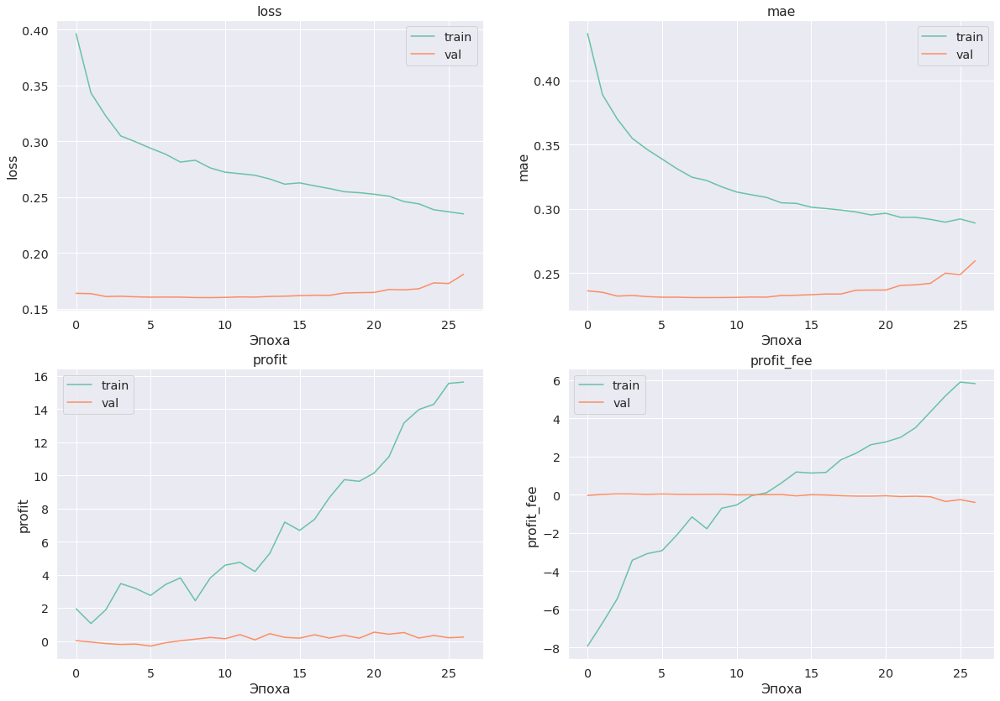

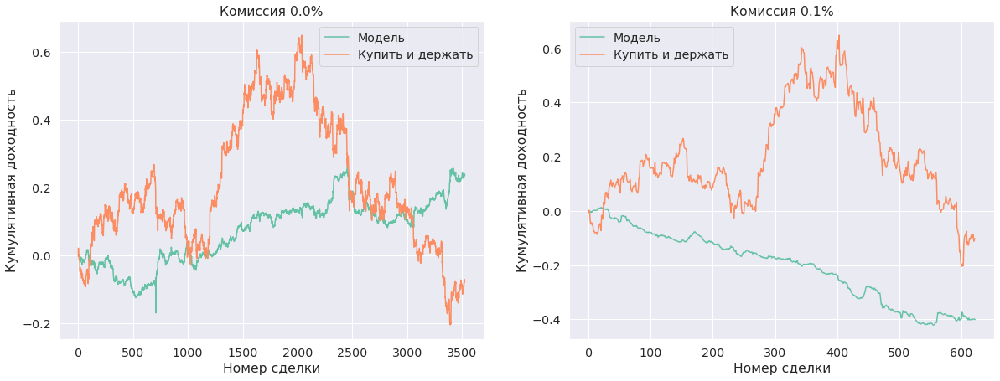

  0%|          | 0/63 [00:00<?, ?it/s]

KeyboardInterrupt: ignored

In [ ]:
model = Model1().to(device)
optimizer = torch.optim.Adam(params=model.parameters(), lr=2e-4)
criterion = nn.MSELoss()
# scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[10, 25], gamma=0.1)

model, history = train(
    model, 
    criterion, 
    optimizer, 
    train_dataloader, 
    test_dataloader,
    # scheduler=scheduler,
    num_epochs=50,
    save_name='Model1',
)

In [ ]:
class Model2(nn.Module):
    def __init__(self):
        super(Model2, self).__init__()

        self.embedding = nn.Embedding(len(vocab), 300, padding_idx=0)
        self.lstm = nn.LSTM(input_size=300, 
                            hidden_size=128, 
                            num_layers=3, 
                            # batch_first=True, 
                            bidirectional=True, 
                            dropout=0.4)
        
        self.dropout0 = nn.Dropout(0.4)
        self.fc1 = nn.Linear(256, 128)
        # self.norm = nn.BatchNorm1d(128)
        self.dropout1 = nn.Dropout(0.3)

        self.fc2 = nn.Linear(128, 32)
        self.dropout2 = nn.Dropout(0.3)

        self.fc3 = nn.Linear(32, 1)

    def forward(self, text, text_len, X):
        embedded = self.embedding(text)

        embedded = embedded.permute(1, 0, 2)
        packed_in = nn.utils.rnn.pack_padded_sequence(embedded, text_len, 
                                        #  batch_first=True, 
                                         enforce_sorted=False)
        out, (hidden, cell) = self.lstm(packed_in)
        # out, _ = nn.utils.rnn.pad_packed_sequence(packed_out, batch_first=True, total_length=MAX_LEN)

        hidden = self.dropout0(torch.cat((hidden[-2,:,:], hidden[-1,:,:]), dim = 1))

        output = self.fc1(hidden)
        # output = self.norm(output)
        output = F.relu(self.dropout1(output))

        output = self.fc2(output)
        output = F.relu(self.dropout2(output))

        output =self.fc3(output)
        return output

Epoch 17 of 50 took 62.897s
  training loss: 	0.123282
  training mae: 	0.198342
  training profit: 	3207.458 %
  training profit ths: 	2824.488 %
  training profit fee: 	1427.558 %
  training profit fee ths: 	2069.053 %
  val loss: 	0.198637 	(0.158604)
  val mae: 	0.277683 	(0.228475)
  val profit: 	-2.594 % 	(70.613 %)
  val profit ths: 	36.195 % 	(36.195 %)
  val profit fee: 	-18.039 % 	(0.000 %)
  val profit fee ths: 	-7.782 % 	(0.000 %)


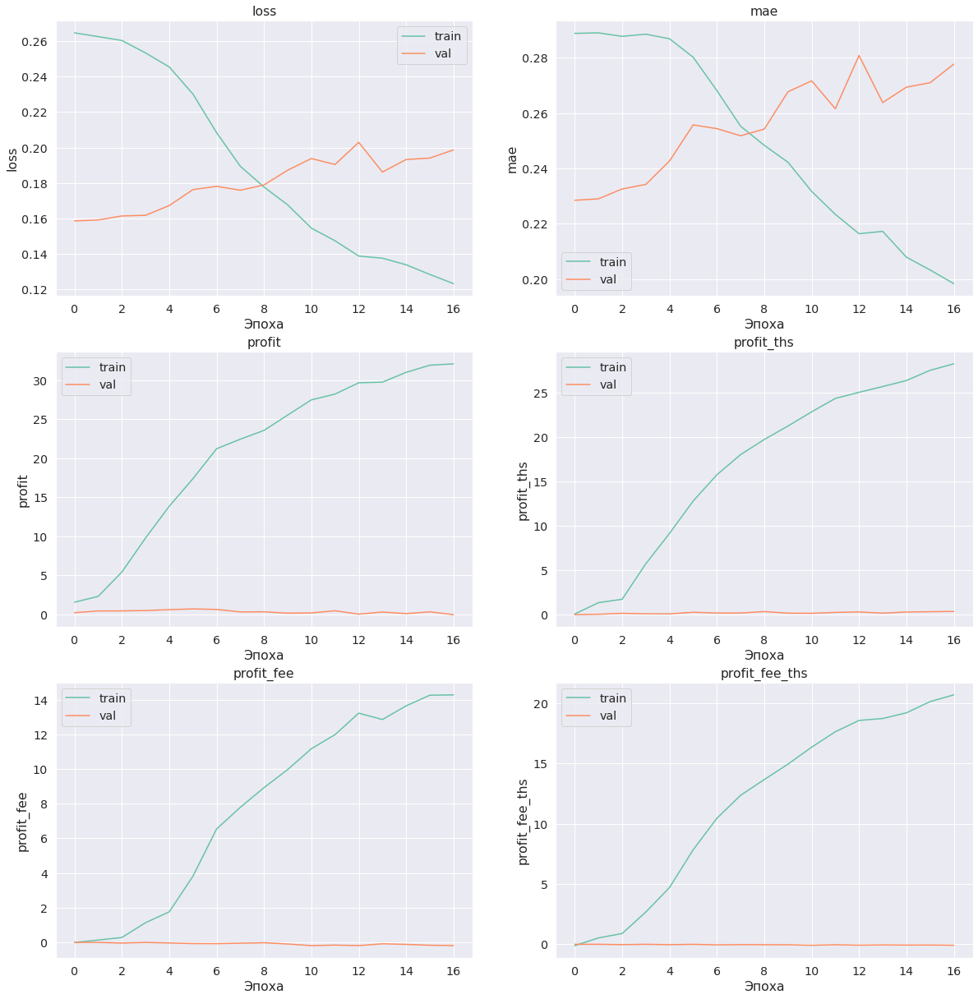

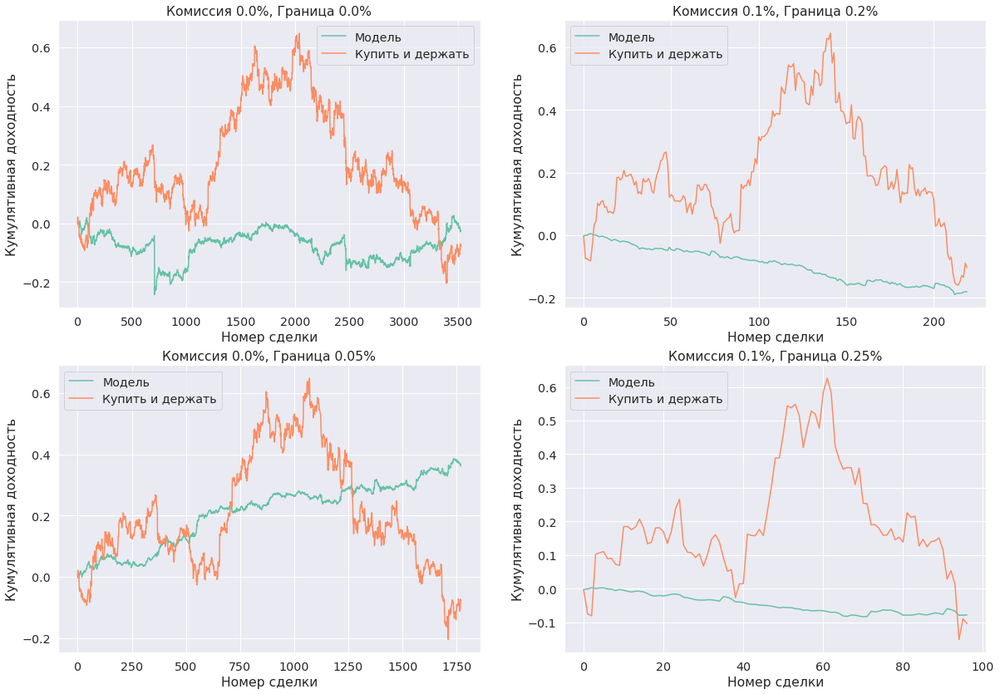

  0%|          | 0/63 [00:00<?, ?it/s]

KeyboardInterrupt: ignored

In [94]:
model2 = Model2().to(device)
optimizer = torch.optim.Adam(params=model2.parameters(), lr=1e-3)
criterion = nn.MSELoss()
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[30], gamma=0.1)

model2, history = train(
    model2, 
    criterion, 
    optimizer, 
    train_dataloader, 
    test_dataloader,
    scheduler=scheduler,
    num_epochs=50,
    save_name='Model2',
)

In [69]:
class Model3(nn.Module):
    def __init__(self):
        super(Model3, self).__init__()

        self.embedding = nn.Embedding(len(vocab), 150, padding_idx=0)
        self.lstm = nn.LSTM(input_size=150, 
                            hidden_size=50, 
                            num_layers=2, 
                            # batch_first=True, 
                            bidirectional=True, 
                            dropout=0.3)
        
        self.dropout0 = nn.Dropout(0.3)
        self.fc1 = nn.Linear(100, 64)
        # self.norm = nn.BatchNorm1d(128)
        self.dropout1 = nn.Dropout(0.2)

        self.fc2 = nn.Linear(64, 1)

    def forward(self, text, text_len, X=None):
        embedded = self.embedding(text)

        embedded = embedded.permute(1, 0, 2)
        packed_in = nn.utils.rnn.pack_padded_sequence(embedded, text_len, 
                                        #  batch_first=True, 
                                         enforce_sorted=False)
        out, (hidden, cell) = self.lstm(packed_in)
        # out, _ = nn.utils.rnn.pad_packed_sequence(packed_out, batch_first=True, total_length=MAX_LEN)

        hidden = self.dropout0(torch.cat((hidden[-2,:,:], hidden[-1,:,:]), dim = 1))

        output = self.fc1(hidden)
        # output = self.norm(output)
        output = F.leaky_relu(self.dropout1(output))

        output = self.fc2(output)
        return output

In [82]:
(np.abs(y_train) > 0.25).mean()

0.3413981838537131

Epoch 26 of 50 took 29.767s
  training loss: 	0.112168
  training mae: 	0.190838
  training profit: 	3273.023 %
  training profit ths: 	2869.836 %
  training profit fee: 	1504.957 %
  training profit fee ths: 	2086.404 %
  val loss: 	0.215943 	(0.159490)
  val mae: 	0.289740 	(0.229569)
  val profit: 	51.041 % 	(68.180 %)
  val profit ths: 	30.793 % 	(38.613 %)
  val profit fee: 	-29.495 % 	(4.011 %)
  val profit fee ths: 	-15.674 % 	(7.634 %)


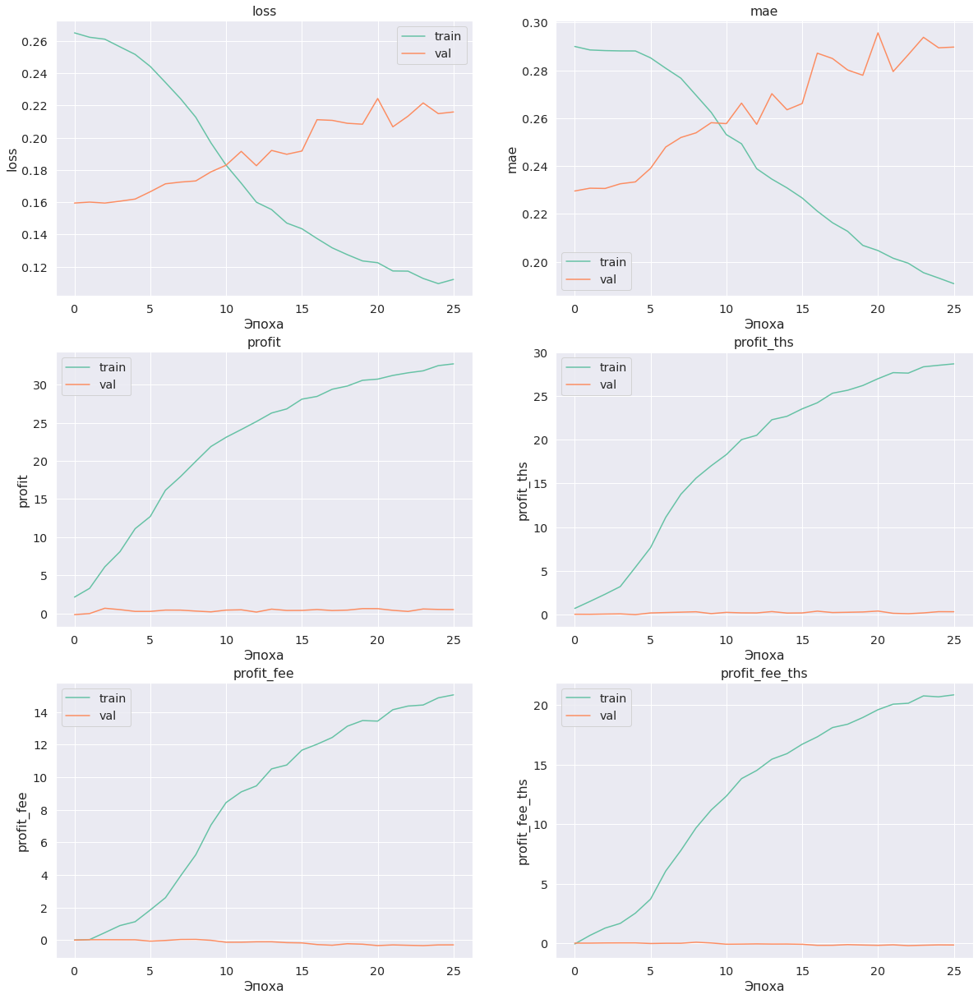

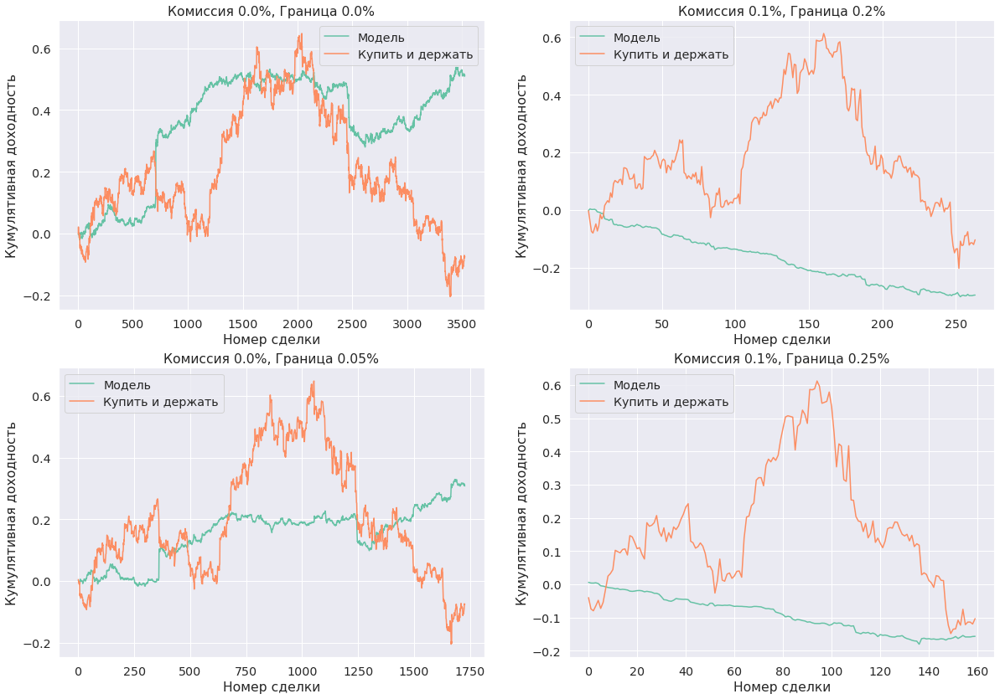

  0%|          | 0/63 [00:00<?, ?it/s]

KeyboardInterrupt: ignored

In [96]:
model3 = Model3().to(device)
optimizer = torch.optim.Adam(params=model3.parameters(), lr=1e-3)
criterion = nn.MSELoss()
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[30], gamma=0.1)

model3, history = train(
    model3, 
    criterion, 
    optimizer, 
    train_dataloader, 
    test_dataloader,
    scheduler=scheduler,
    num_epochs=50,
    save_name='Model3',
)

In [97]:
class Model4(nn.Module):
    def __init__(self):
        super(Model4, self).__init__()

        self.embedding = nn.Embedding(len(vocab), 100, padding_idx=0)
        self.lstm = nn.LSTM(input_size=100, 
                            hidden_size=50, 
                            num_layers=5, 
                            # batch_first=True, 
                            bidirectional=True, 
                            dropout=0.5)
        
        self.dropout0 = nn.Dropout(0.4)
        self.fc1 = nn.Linear(100, 32)
        # self.norm = nn.BatchNorm1d(128)
        self.dropout1 = nn.Dropout(0.2)

        self.fc2 = nn.Linear(32, 1)

    def forward(self, text, text_len, X):
        embedded = self.embedding(text)

        embedded = embedded.permute(1, 0, 2)
        packed_in = nn.utils.rnn.pack_padded_sequence(embedded, text_len, 
                                        #  batch_first=True, 
                                         enforce_sorted=False)
        out, (hidden, cell) = self.lstm(packed_in)
        # out, _ = nn.utils.rnn.pad_packed_sequence(packed_out, batch_first=True, total_length=MAX_LEN)

        hidden = self.dropout0(torch.cat((hidden[-2,:,:], hidden[-1,:,:]), dim = 1))

        output = self.fc1(hidden)
        # output = self.norm(output)
        output = F.leaky_relu(self.dropout1(output))

        output = self.fc2(output)
        return output

Epoch 21 of 50 took 93.341s
  training loss: 	0.140220
  training mae: 	0.223229
  training profit: 	2912.217 %
  training profit ths: 	2516.860 %
  training profit fee: 	1230.978 %
  training profit fee ths: 	1783.983 %
  val loss: 	0.219069 	(0.158484)
  val mae: 	0.298820 	(0.228179)
  val profit: 	29.807 % 	(72.121 %)
  val profit ths: 	39.417 % 	(39.417 %)
  val profit fee: 	-39.274 % 	(0.930 %)
  val profit fee ths: 	-17.156 % 	(1.641 %)


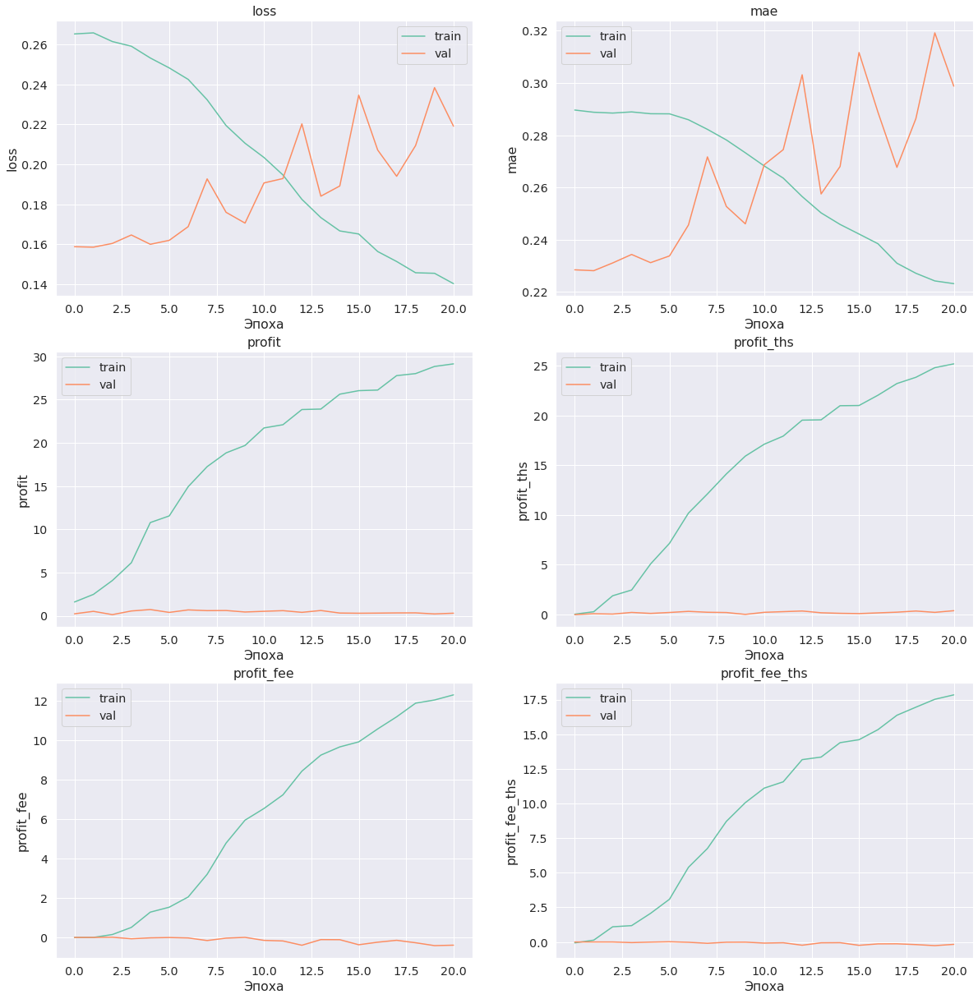

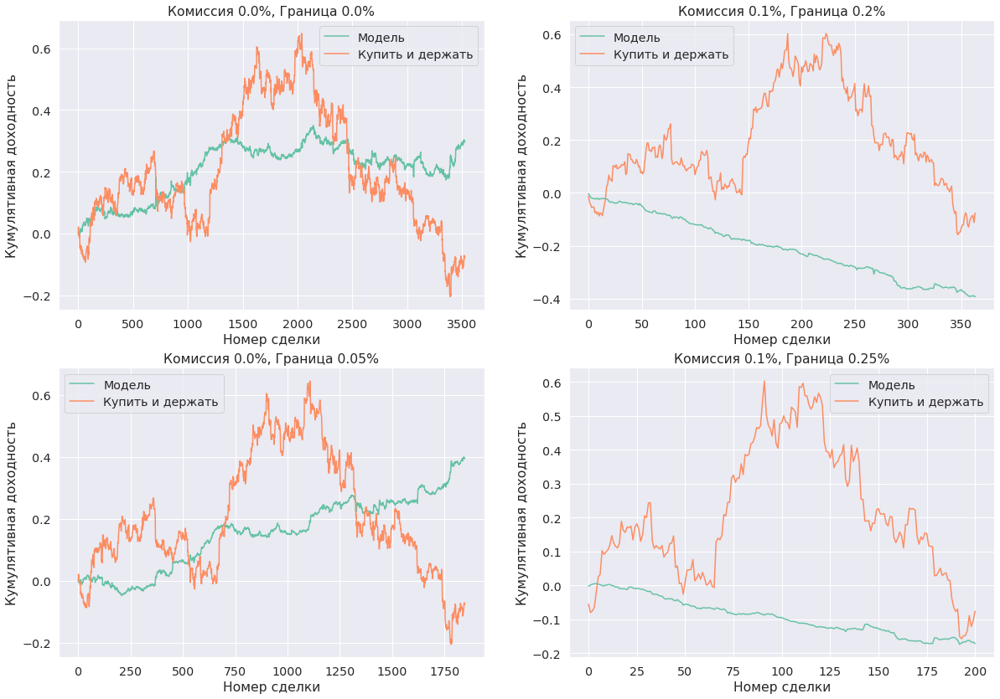

  0%|          | 0/63 [00:00<?, ?it/s]

KeyboardInterrupt: ignored

In [98]:
model4 = Model4().to(device)
optimizer = torch.optim.Adam(params=model4.parameters(), lr=1e-3)
criterion = nn.MSELoss()
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[30], gamma=0.1)

model4, history = train(
    model4, 
    criterion, 
    optimizer, 
    train_dataloader, 
    test_dataloader,
    scheduler=scheduler,
    num_epochs=50,
    save_name='Model4',
)

In [136]:
class Model5(nn.Module):
    def __init__(self):
        super(Model5, self).__init__()

        self.embedding = nn.Embedding(len(vocab), 150, padding_idx=0)
        self.lstm = nn.LSTM(input_size=150, 
                            hidden_size=50, 
                            num_layers=2, 
                            batch_first=True, 
                            bidirectional=True, 
                            dropout=0.3)
        
        self.convs = nn.ModuleList([
          nn.Conv1d(
              in_channels=100, out_channels=128, 
              kernel_size=fs,
          ) for fs in [3, 4, 5]
        ])

        self.dropout0 = nn.Dropout(0.4)
        self.fc1 = nn.Linear(128 * 3, 64)
        # self.norm = nn.BatchNorm1d(128)
        self.dropout1 = nn.Dropout(0.3)

        self.fc2 = nn.Linear(64, 1)

    def forward(self, text, text_len, X):
        embedded = self.embedding(text)

        output, (_, _) = self.lstm(embedded)

        output = output.permute(0, 2, 1)
        conved = [F.relu(conv(output)) for conv in self.convs]
        pooled = [F.max_pool1d(conv, conv.shape[2]).squeeze(2) for conv in conved]
        pooled = self.dropout0(torch.cat(pooled, dim = 1))   

        output = self.fc1(pooled)
        # output = self.norm(output)
        output = F.relu(self.dropout1(output))

        output = self.fc2(output)
        return output

Epoch 15 of 50 took 45.450s
  training loss: 	0.163052
  training mae: 	0.236450
  training profit: 	2231.444 %
  training profit ths: 	1694.680 %
  training profit fee: 	676.943 %
  training profit fee ths: 	1111.658 %
  val loss: 	0.188066 	(0.158351)
  val mae: 	0.270579 	(0.228309)
  val profit: 	26.998 % 	(48.908 %)
  val profit ths: 	37.540 % 	(37.540 %)
  val profit fee: 	-12.860 % 	(0.057 %)
  val profit fee ths: 	-5.463 % 	(0.000 %)


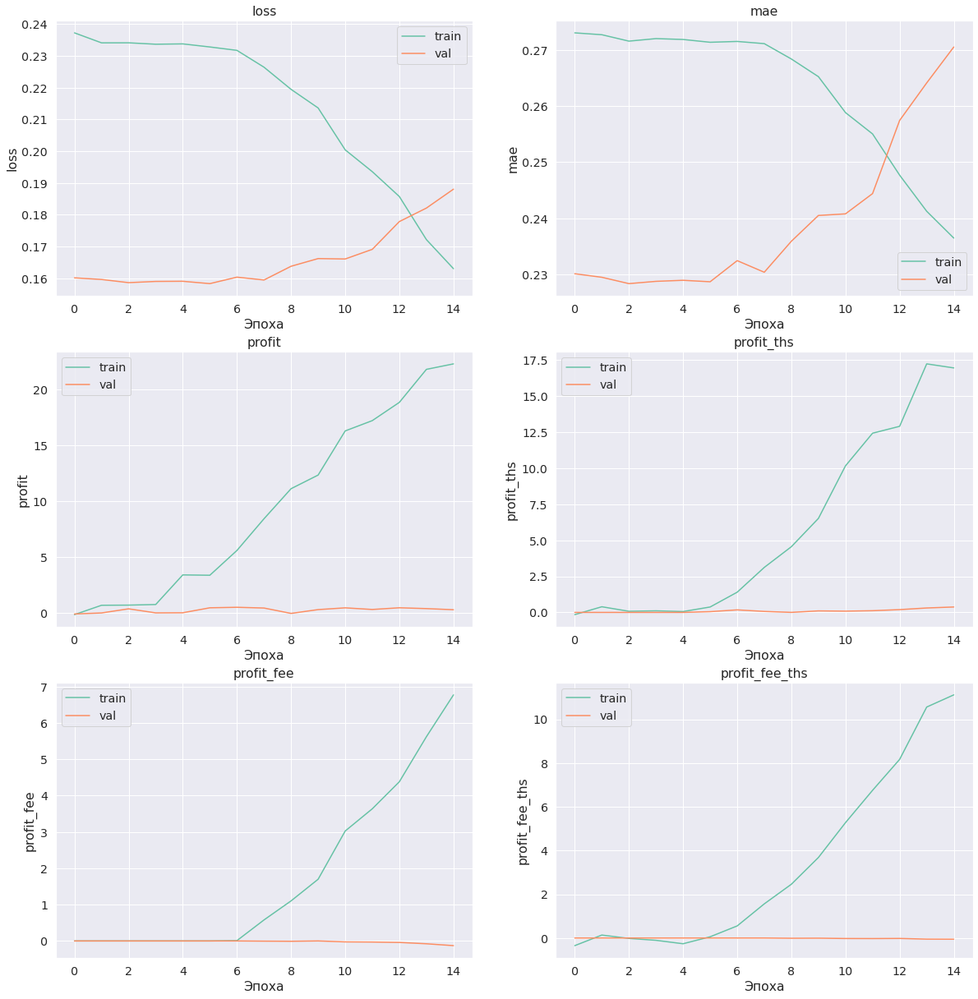

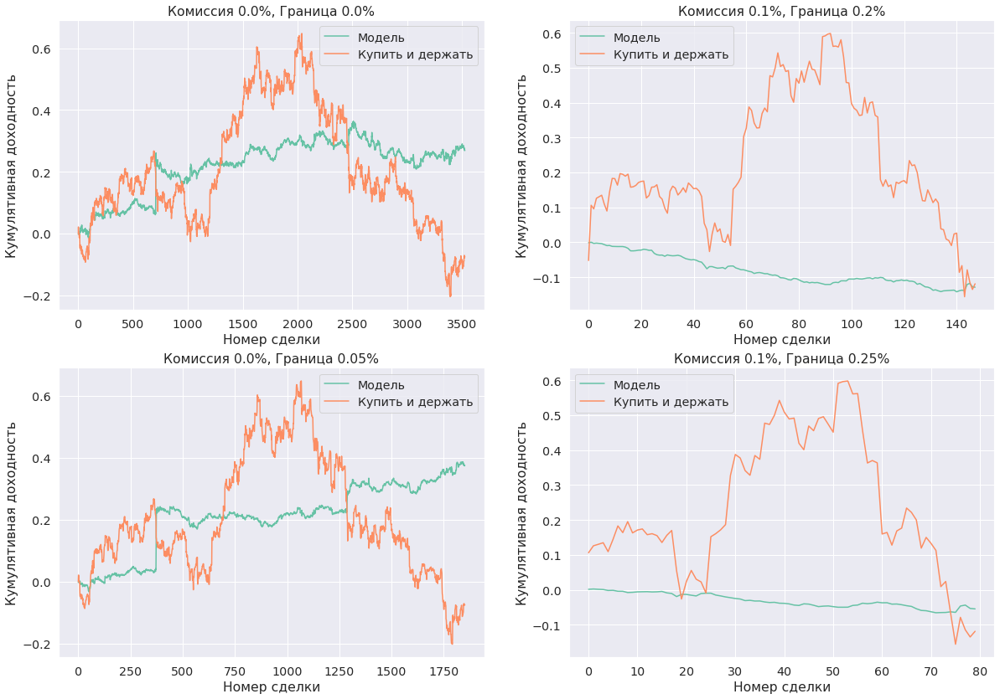

  0%|          | 0/60 [00:00<?, ?it/s]

KeyboardInterrupt: ignored

In [137]:
model5 = Model5().to(device)
optimizer = torch.optim.Adam(params=model5.parameters(), lr=1e-3)
criterion = nn.MSELoss()
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[30], gamma=0.1)

model5, history = train(
    model5, 
    criterion, 
    optimizer, 
    train_dataloader, 
    test_dataloader,
    scheduler=scheduler,
    num_epochs=50,
    save_name='Model5',
)

In [138]:
class Model6(nn.Module):
    def __init__(self):
        super(Model6, self).__init__()

        self.embedding = nn.Embedding(len(vocab), 150, padding_idx=0)
        self.lstm = nn.LSTM(input_size=150, 
                            hidden_size=64, 
                            num_layers=2, 
                            # batch_first=True, 
                            bidirectional=True, 
                            dropout=0.3)
        self.dropout0 = nn.Dropout(0.3)
        
        # -------

        self.fc1_X = nn.Linear(147, 1024)
        self.dropout1_X = nn.Dropout(0.3)
        self.fc2_X = nn.Linear(1024, 128)
        self.dropout2_X = nn.Dropout(0.3)
        self.norm = nn.BatchNorm1d(128)

        # -------

        self.fc1 = nn.Linear(64 * 2 + 128, 64)
        self.dropout1 = nn.Dropout(0.2)

        self.fc2 = nn.Linear(64, 1)

    def forward(self, text, text_len, X):
        embedded = self.embedding(text)

        embedded = embedded.permute(1, 0, 2)
        packed_in = nn.utils.rnn.pack_padded_sequence(embedded, text_len, 
                                        #  batch_first=True, 
                                         enforce_sorted=False)
        out, (hidden, cell) = self.lstm(packed_in)
        # out, _ = nn.utils.rnn.pad_packed_sequence(packed_out, batch_first=True, total_length=MAX_LEN)

        hidden = self.dropout0(torch.cat((hidden[-2,:,:], hidden[-1,:,:]), dim = 1))

        # -------

        X_out = F.relu(self.dropout1_X(self.fc1_X(X)))
        X_out = self.norm(F.relu(self.dropout2_X(self.fc2_X(X_out))))

        # -------

        output = self.fc1(torch.cat([hidden, X_out], dim=1))
        # output = self.norm(output)
        output = F.leaky_relu(self.dropout1(output))

        output = self.fc2(output)
        return output

Epoch 50 of 50 took 29.785s
  training loss: 	1049.788013
  training mae: 	13.097974
  training profit: 	-68.852 %
  training profit ths: 	-68.030 %
  training profit fee: 	-1471.977 %
  training profit fee ths: 	-1561.048 %
  val loss: 	8.279845 	(8.279845)
  val mae: 	1.544485 	(1.544485)
  val profit: 	-14.626 % 	(33.219 %)
  val profit ths: 	-23.181 % 	(35.199 %)
  val profit fee: 	-263.300 % 	(-246.802 %)
  val profit fee ths: 	-243.002 % 	(-231.257 %)


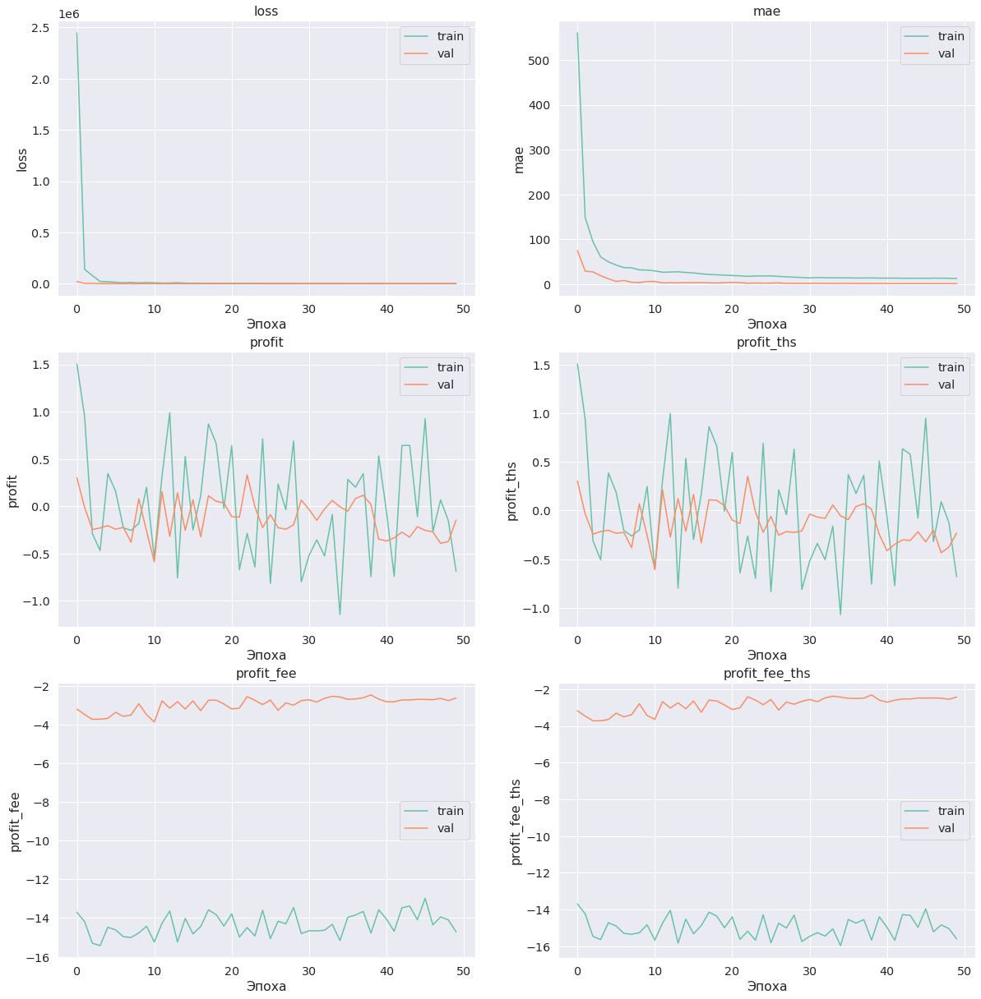

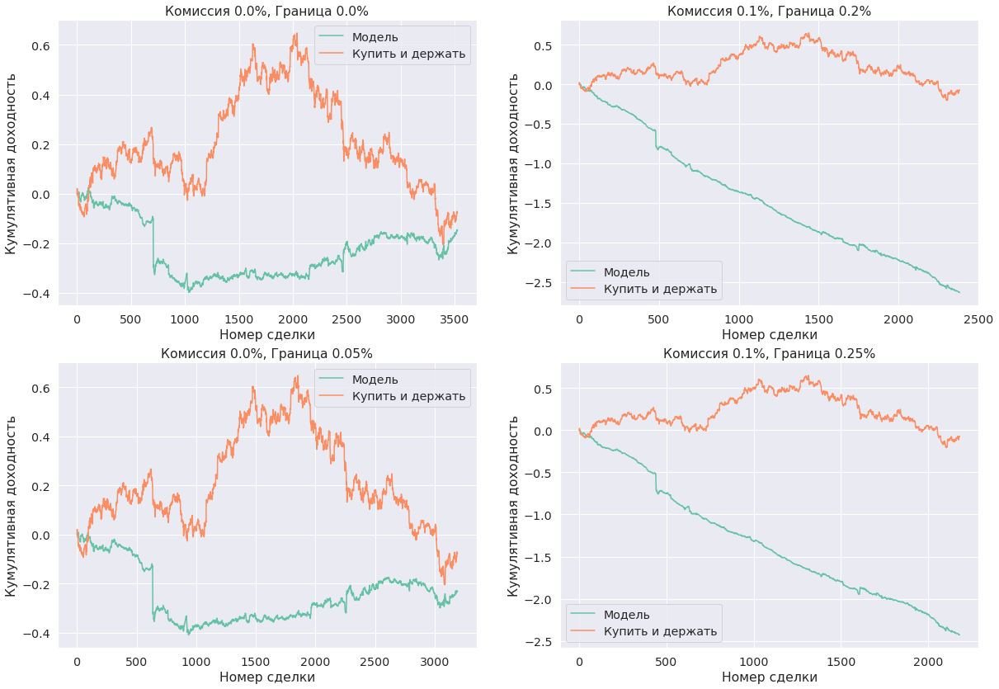

In [139]:
model6 = Model6().to(device)
optimizer = torch.optim.Adam(params=model6.parameters(), lr=1e-3)
criterion = nn.MSELoss()
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[30], gamma=0.1)

model6, history = train(
    model6, 
    criterion, 
    optimizer, 
    train_dataloader, 
    test_dataloader,
    scheduler=scheduler,
    num_epochs=50,
    save_name='Model6',
)

In [140]:
for metric in history:
    for data_type in history[metric]:
        history[metric][data_type] = history[metric][data_type][25:]

Epoch 4 of 50 took 29.792s
  training loss: 	941.125104
  training mae: 	12.734305
  training profit: 	18.208 %
  training profit ths: 	16.022 %
  training profit fee: 	-1388.742 %
  training profit fee ths: 	-1471.981 %
  val loss: 	8.954062 	(8.279845)
  val mae: 	1.553377 	(1.544485)
  val profit: 	-4.077 % 	(11.603 %)
  val profit ths: 	-4.937 % 	(6.966 %)
  val profit fee: 	-262.108 % 	(-241.652 %)
  val profit fee ths: 	-243.173 % 	(-222.907 %)


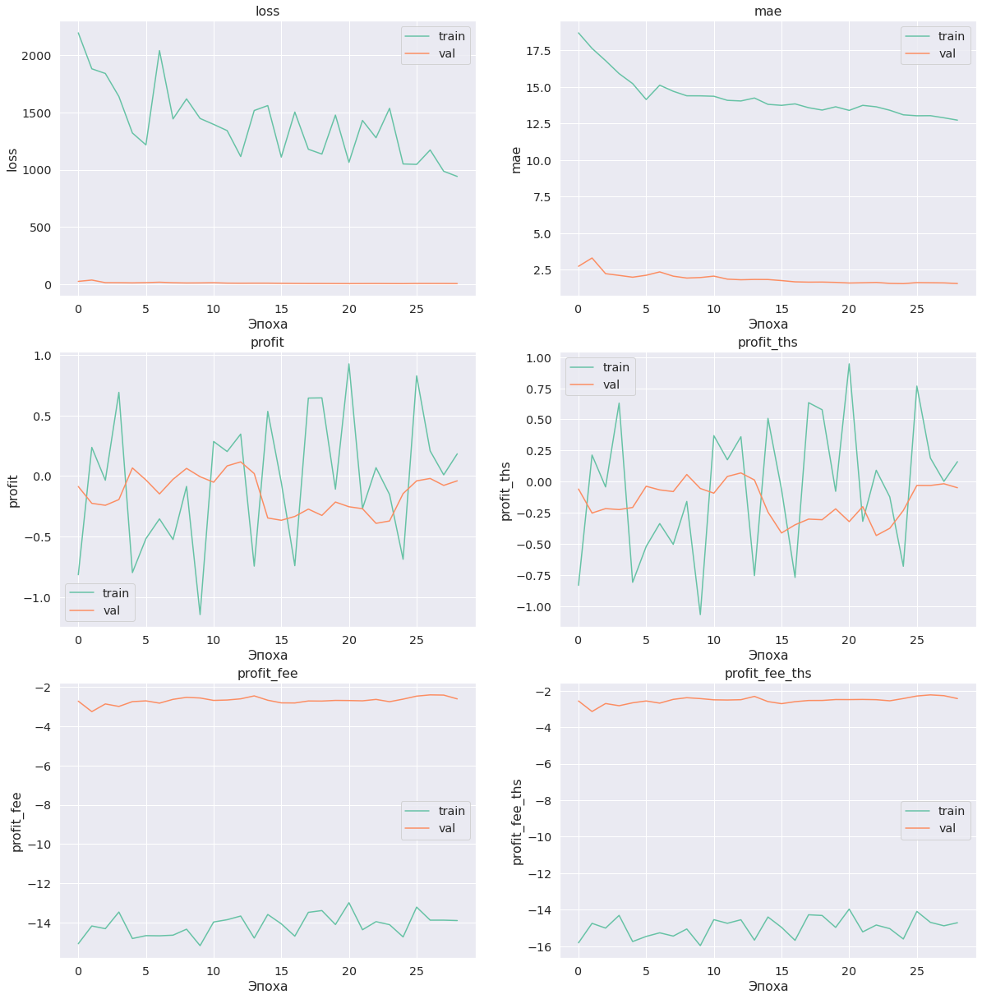

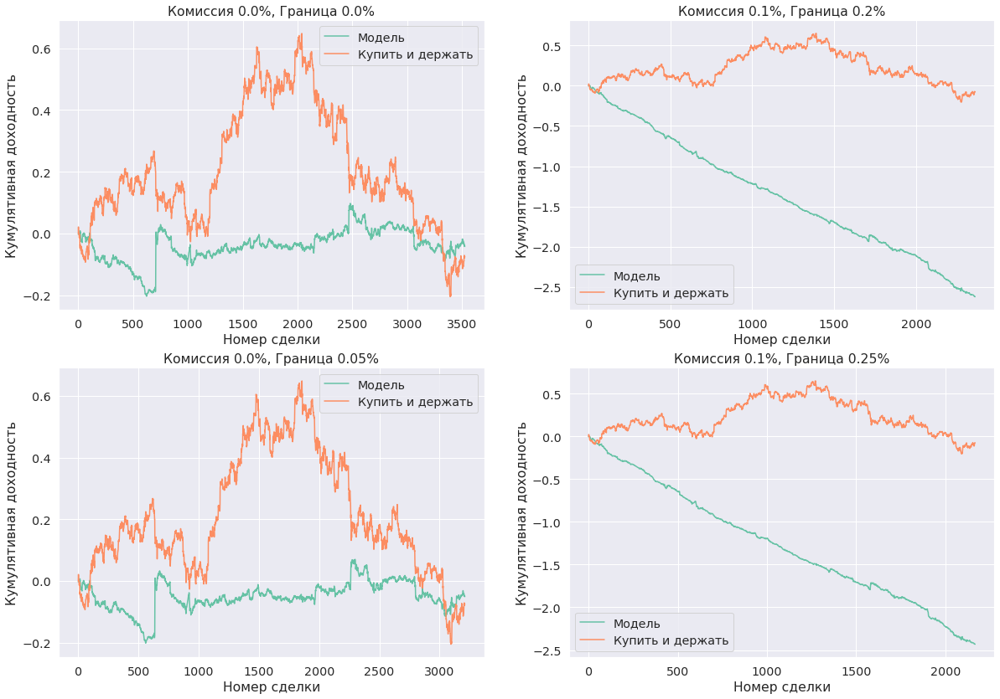

  0%|          | 0/60 [00:00<?, ?it/s]

In [ ]:
model6, history = train(
    model6, 
    criterion, 
    optimizer, 
    train_dataloader, 
    test_dataloader,
    history=history,
    scheduler=scheduler,
    num_epochs=50,
    save_name='Model6_2',
)

In [60]:
device = 'cpu'

In [71]:
model3 = Model3().to(device)
train_info = torch.load(MODELS_DIR + 'Model3_profit_fee_ths.data', map_location=torch.device(device))
model3.load_state_dict(train_info['model_state_dict'])

<All keys matched successfully>

In [76]:
def predict(
    model, 
    criterion,
    val_dataloader,
    threshold=0.0005
):    
    val_loss = 0.0
    val_mae = 0.0

    val_profit = ProfitPercent(fee=0.0, buy_hold_returns=buy_and_hold_test)
    val_profit_threshold = ProfitPercent(fee=0.0, buy_hold_returns=buy_and_hold_test, threshold=threshold)

    val_profit_fee = ProfitPercent(fee=FEE, buy_hold_returns=buy_and_hold_test)
    val_profit_fee_threshold = ProfitPercent(fee=FEE, buy_hold_returns=buy_and_hold_test, threshold=2 * FEE + threshold)

    model.eval()

    for texts, lens, values in tqdm(val_dataloader):
        texts = texts.to(device)
        values = values.to(device)

        pred_ret = model(texts, lens)

        loss = criterion(pred_ret, values)
        
        val_loss += loss.detach().cpu().numpy()
        val_mae += mean_absolute_error(values.detach().cpu().numpy(), pred_ret.detach().cpu().numpy())
        val_profit.update_state(values, pred_ret)
        val_profit_threshold.update_state(values, pred_ret)
        val_profit_fee.update_state(values, pred_ret)
        val_profit_fee_threshold.update_state(values, pred_ret)

        del loss, pred_ret
        del texts, lens, values

    val_loss /= len(val_dataloader)
    val_mae /= len(val_dataloader)
    
    # Выводим метрики и строим графики
    display.clear_output()

    print(f'  val loss: \t{val_loss:.6f}')
    print(f'  val mae: \t{val_mae:.6f}')
    print(f'  val profit: \t{val_profit.result() * 100:.3f} %')
    print(f'  val profit ths: \t{val_profit_threshold.result() * 100:.3f} %')
    print(f'  val profit fee: \t{val_profit_fee.result() * 100:.3f} %')
    print(f'  val profit fee ths: \t{val_profit_fee_threshold.result() * 100:.3f} %')
    
    # plot_history(history, save_name=f'{save_name}_metris.png')

    plt.figure(figsize=(20, 14))

    plt.subplot(2, 2, 1)
    val_profit.plot()
    plt.subplot(2, 2, 2)
    val_profit_fee.plot()

    plt.subplot(2, 2, 3)
    val_profit_threshold.plot()
    plt.subplot(2, 2, 4)
    val_profit_fee_threshold.plot()

    # plt.savefig(profit_dir + f'/{epoch + 1}epoch.png')
    plt.show()

    return model

  val loss: 	0.173207
  val mae: 	0.253889
  val profit: 	31.166 %
  val profit ths: 	30.166 %
  val profit fee: 	4.011 %
  val profit fee ths: 	7.634 %


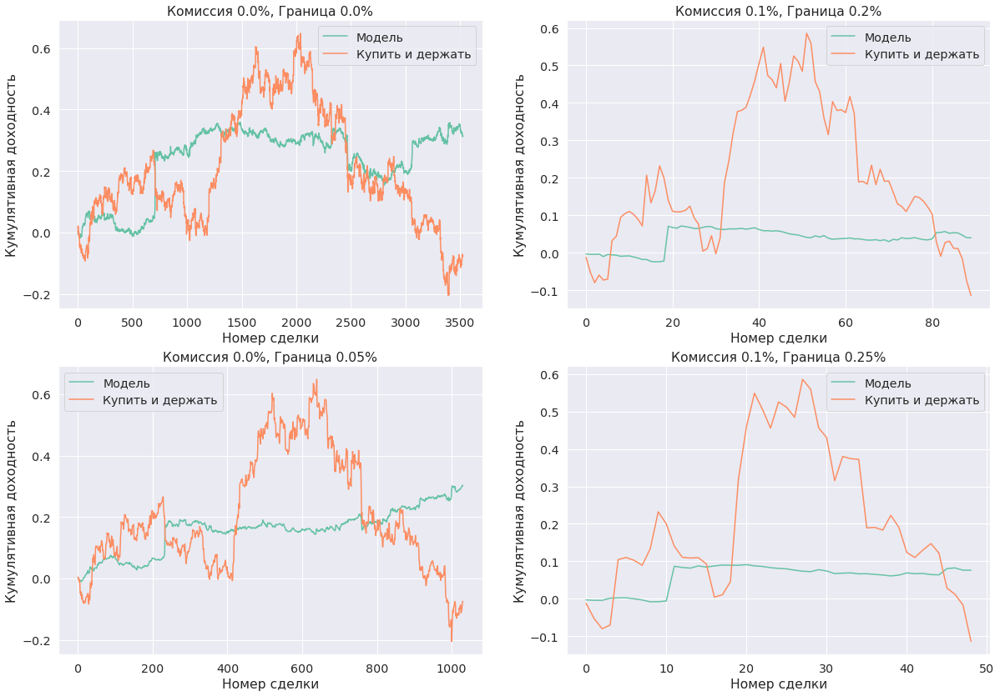

Model3(
  (embedding): Embedding(10495, 150, padding_idx=0)
  (lstm): LSTM(150, 50, num_layers=2, dropout=0.3, bidirectional=True)
  (dropout0): Dropout(p=0.3, inplace=False)
  (fc1): Linear(in_features=100, out_features=64, bias=True)
  (dropout1): Dropout(p=0.2, inplace=False)
  (fc2): Linear(in_features=64, out_features=1, bias=True)
)

In [77]:
criterion = nn.MSELoss()

predict(model3, criterion, test_dataloader)

In [78]:
# predict(model3, criterion, train_dataloader)

  0%|          | 0/63 [00:00<?, ?it/s]

IndexError: ignored